In [1]:

import numpy as np
import os
import os.path as osp
import sys

path = osp.abspath(osp.join(os.getcwd(), "..", ".."))
sys.path.append(path)
print(f"PythonPath added : {path}")
from src import get_dataset
from IPython.display import Audio, display




PythonPath added : /home/antoine/Bureau/3A/time_series/Dictionary-Learning


In [2]:
Ys, sampling_rates, files = get_dataset("instruments")

def to_mono(s):
    if len(s.shape) == 2:  # Stereo signal
        return np.mean(s, axis=1)  # Average the two channels to get mono
    return s

signals = list(map(to_mono, Ys))

/home/antoine/Bureau/3A/time_series/Dictionary-Learning/src/dataset/dataloaders.py:121: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sr, y = wavfile.read(file_path)


In [3]:
print(np.unique(np.array(sampling_rates)))

[16000 24000 44100 48000]


We will resample to have a fixed sampling rate for our training dataset.

In [4]:
from scipy.signal import resample

target_rate = 16000

resampled_signals = []

for i, (signal, rate) in enumerate(zip(signals, sampling_rates)):

    num_samples = int(len(signal) * target_rate / rate)  # Target number of samples
    resampled_signal = resample(signal, num_samples)  # Resample using FFT

    # Append the resampled signal
    resampled_signals.append(resampled_signal)


In [5]:
idx = np.random.randint(0, len(Ys))
signal = signals[idx]
resampled_signal = resampled_signals[idx]
rate = sampling_rates[idx]
display(Audio(signal, rate=rate))
display(Audio(resampled_signal, rate=target_rate))

We can now generate our frames to learn our dictionary

### Config

In [6]:
length_frame_ms = 50
length_delta_frame_ms = 20

In [7]:
def generate_frames(signal, time_length_ms, frame_delta_ms):
    nb_samples = signal.shape[0]
    time_length_s = time_length_ms/1000
    frame_nb_samples = int(target_rate * time_length_s)
    frame_delta_samples = int(target_rate * frame_delta_ms/1000)
    frames = []
    for k in range(0,nb_samples -frame_nb_samples, frame_delta_samples):
        frames.append(signal[k:k+frame_nb_samples])
    return np.array(frames), frame_delta_samples


frames = np.concatenate(list(map(lambda x : generate_frames(x, length_frame_ms, length_delta_frame_ms)[0], resampled_signals)), axis=0)

def preprocessing(X):
    means = X.mean(axis=1)
    std = X.std(axis=1)
    infos = {"means" : means, "std" : std}
    return (X - means[:,np.newaxis]) / std[:,np.newaxis], infos

def postprocessing(X, infos):
    means = infos["means"]
    std = infos["std"]
    return X * std[:,np.newaxis] + means[:,np.newaxis] 

x_train, infos = preprocessing(frames)
print("number of data", len(x_train))

number of data 298097


In [8]:
from sklearn.decomposition import MiniBatchDictionaryLearning
dict_learner = MiniBatchDictionaryLearning(n_components=500, batch_size=64, transform_algorithm='lasso_lars', transform_alpha=0.15, max_iter=1, random_state=42, verbose=True, max_no_improvement=10, tol=1e-1)
dict_learner.fit(x_train)

[dict_learning]
25 unused atoms resampled.
Minibatch step 1/4658: mean batch cost: 2.5292786522346624
25 unused atoms resampled.
Minibatch step 2/4658: mean batch cost: 227.51064265123694
5 unused atoms resampled.
Minibatch step 3/4658: mean batch cost: 235.8221365953391
Minibatch step 4/4658: mean batch cost: 228.71023524188217
Minibatch step 5/4658: mean batch cost: 217.3514794412296
Minibatch step 6/4658: mean batch cost: 192.3959132411107
Minibatch step 7/4658: mean batch cost: 171.6618675094675
Minibatch step 8/4658: mean batch cost: 179.4536543834156
Minibatch step 9/4658: mean batch cost: 180.41005592009867
Minibatch step 10/4658: mean batch cost: 183.19291203302555
Minibatch step 11/4658: mean batch cost: 185.5030920115273
Minibatch step 12/4658: mean batch cost: 160.9088565489663
Minibatch step 13/4658: mean batch cost: 169.81445125881973
Minibatch step 14/4658: mean batch cost: 175.36800243575345
Minibatch step 15/4658: mean batch cost: 155.38579451497247
Minibatch step 16/46

MiniBatchDictionaryLearning(batch_size=64, max_iter=1, n_components=500,
                            random_state=42, tol=0.1,
                            transform_algorithm='lasso_lars',
                            transform_alpha=0.15, verbose=True)

In [9]:
idx = np.random.randint(0, len(Ys))
signal = resampled_signals[idx]
rate = sampling_rates[idx]

In [10]:

def make_prediction(X, dict_learner):
    X, infos = preprocessing(X)
    weights_encoded = dict_learner.transform(X)
    print(weights_encoded.shape, dict_learner.components_.shape)
    x_transformed = weights_encoded @ dict_learner.components_
    x_transformed = postprocessing(x_transformed, infos)
    return x_transformed


def fuze_patches_predictions(patches, delta_samples):
    patch_size = patches.shape[1]
    audio_reconstructed = np.zeros(len(patches) * delta_samples+ patch_size - delta_samples)
    number_writtings = np.zeros(len(patches) * delta_samples+ patch_size - delta_samples)
    
    for k in range(len(patches)):
        audio_reconstructed[k*delta_samples:k*delta_samples + patch_size] += patches[k]
        number_writtings[k*delta_samples:k*delta_samples + patch_size] += 1
    
    audio_reconstructed = audio_reconstructed / number_writtings
    print(len(audio_reconstructed))
    return audio_reconstructed




delta_patch_reconstruction = 50
signal_patches, frame_delta_samples = generate_frames(signal, length_frame_ms, delta_patch_reconstruction)
signal_patches_encoded = make_prediction(signal_patches, dict_learner)
signal_reconstructed = fuze_patches_predictions(signal_patches_encoded,frame_delta_samples )
display(Audio(signal, rate=target_rate))
display(Audio(signal_reconstructed, rate=target_rate))

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x74d09b95fd90>>
Traceback (most recent call last):
  File "/home/antoine/anaconda3/envs/rapids-24.10/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


KeyboardInterrupt: 

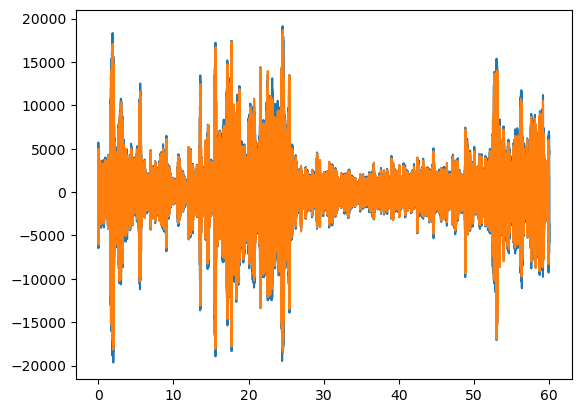

In [53]:
import matplotlib.pyplot as plt
plt.plot(np.arange(len(signal)) / target_rate, signal)
plt.plot(np.arange(len(signal_reconstructed)) / target_rate, signal_reconstructed)

In [54]:
noised_signal = signal + np.random.normal(0, 0.1*signal.std(), size=len(signal))


delta_patch_reconstruction = 50
signal_patches, frame_delta_samples = generate_frames(noised_signal, length_frame_ms, delta_patch_reconstruction)
signal_patches_encoded = make_prediction(signal_patches, dict_learner)
signal_reconstructed = fuze_patches_predictions(signal_patches_encoded,frame_delta_samples )


display(Audio(signal, rate=target_rate))
display(Audio(noised_signal, rate=target_rate))
display(Audio(signal_reconstructed, rate=target_rate))

(1199, 500) (500, 800)
959200


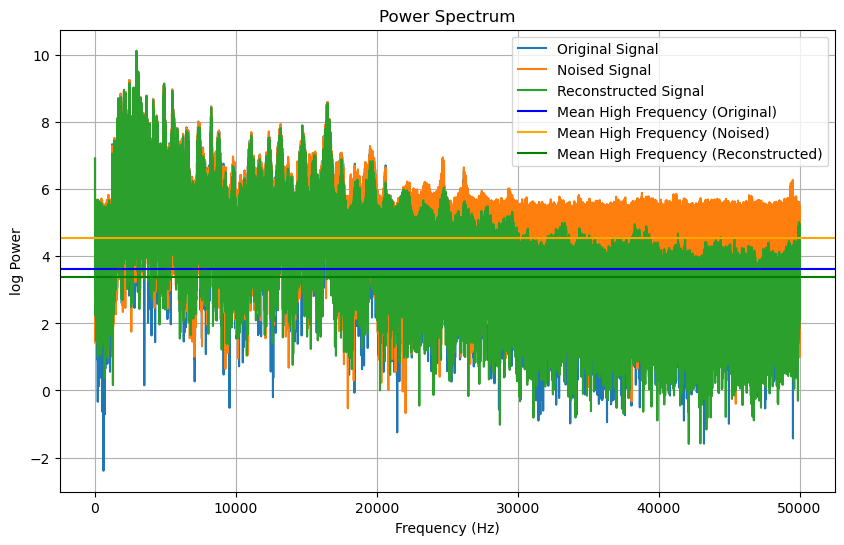

In [55]:
from scipy.io.wavfile import write

def save_audio(signal, path):

    # If the signal is in floating point format, scale it to a valid integer range
    # For 16-bit PCM audio, the range is from -32768 to 32767
    scaled_signal = np.int16(signal / np.max(np.abs(signal)) * 32767)
    
    # Save the signal as a .wav file
    write(path, target_rate, scaled_signal)
    
save_audio(signal, "original.wav")
save_audio(noised_signal, "noised.wav")
save_audio(signal_reconstructed, "denoised.wav")

def power_spectrum(signal, fs):
    fft_signal = np.fft.fft(signal)
    n = len(signal)
    power_spectrum = np.abs(fft_signal)**2 / n
    frequencies = np.fft.fftfreq(n, 1/fs)
    return frequencies[:n//2], power_spectrum[:n//2]


def plot_power_spectra(signal, noised_signal, signal_reconstructed, fs):
    f_signal, ps_signal = power_spectrum(signal, fs)
    f_noised, ps_noised = power_spectrum(noised_signal, fs)
    f_reconstructed, ps_reconstructed = power_spectrum(signal_reconstructed, fs)

    log_ps_signal = np.log10(ps_signal)
    log_ps_noised = np.log10(ps_noised)
    log_ps_reconstructed = np.log10(ps_reconstructed)
    mean_high_freq_signal = np.mean(log_ps_signal[len(log_ps_signal)//2:])
    mean_high_freq_noised = np.mean(log_ps_noised[len(log_ps_noised)//2:])
    mean_high_freq_reconstructed = np.mean(log_ps_reconstructed[len(log_ps_reconstructed)//2:])

    plt.figure(figsize=(10, 6))
    
    
    
    
    
    plt.plot(f_signal, log_ps_signal, label='Original Signal')
    plt.plot(f_noised, log_ps_noised, label='Noised Signal')
    plt.plot(f_reconstructed, log_ps_reconstructed, label='Reconstructed Signal')
    
    plt.axhline(y=mean_high_freq_signal, color='blue', label=f'Mean High Frequency (Original)')
    plt.axhline(y=mean_high_freq_noised, color='orange', label=f'Mean High Frequency (Noised)')
    plt.axhline(y=mean_high_freq_reconstructed, color='green', label=f'Mean High Frequency (Reconstructed)')
    
    plt.title('Power Spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('log Power')
    plt.legend()
    plt.grid(True)
    plt.show()

fs = 100000
plot_power_spectra(signal, noised_signal, signal_reconstructed, fs)

In [42]:



np.save("audio_dict.npy", dict_learner.components_)

In [43]:
path = "Alderiate vs Doran - 1v1 Red Bull League of Its Own 2024.mp3"
import librosa

audio, sr = librosa.load(path, sr=target_rate)

In [44]:
audio = audio[:len(audio) // 10]

In [45]:
delta_patch_reconstruction = 20
signal_patches, frame_delta_samples = generate_frames(audio, length_frame_ms, delta_patch_reconstruction)
signal_patches_encoded = make_prediction(signal_patches, dict_learner)
signal_reconstructed = fuze_patches_predictions(signal_patches_encoded,frame_delta_samples )
display(Audio(audio, rate=target_rate))
display(Audio(signal_reconstructed, rate=target_rate))

KeyboardInterrupt: 

In [17]:
save_audio(signal_reconstructed, "reconstructed_lol.wav")